**This is my project for the purpose of Coral Classification (healthy , bleached)**
***First we need to prepare the available dataset suitable for training***

In [31]:
# Step - 1. First let us define the general dataset 
train_dir = "/kaggle/input/koral22/train"
valid_dir = "/kaggle/input/koral22/valid"

# Step - 2. Scaling the dataset(pre-processed and augmented) images
from tensorflow.keras.preprocessing.image import ImageDataGenerator
modifier = ImageDataGenerator(rescale = 1/255.)

# Step - 3. Applying the changes to the dataset(both Train and Test)
train_data = modifier.flow_from_directory(directory = train_dir,
                                          batch_size = 32,
                                          target_size = (224,224),
                                          class_mode = "binary",
                                          shuffle = True,
                                          color_mode = "rgb")

valid_data = modifier.flow_from_directory(directory = valid_dir,
                                          batch_size = 32,
                                          shuffle = True,
                                          target_size = (224,224),
                                          class_mode = "binary",
                                          color_mode = "rgb")

Found 2442 images belonging to 2 classes.
Found 91 images belonging to 2 classes.


**Before creating the CNN architecture(model) for coral classification let us have a look into some dataset images**

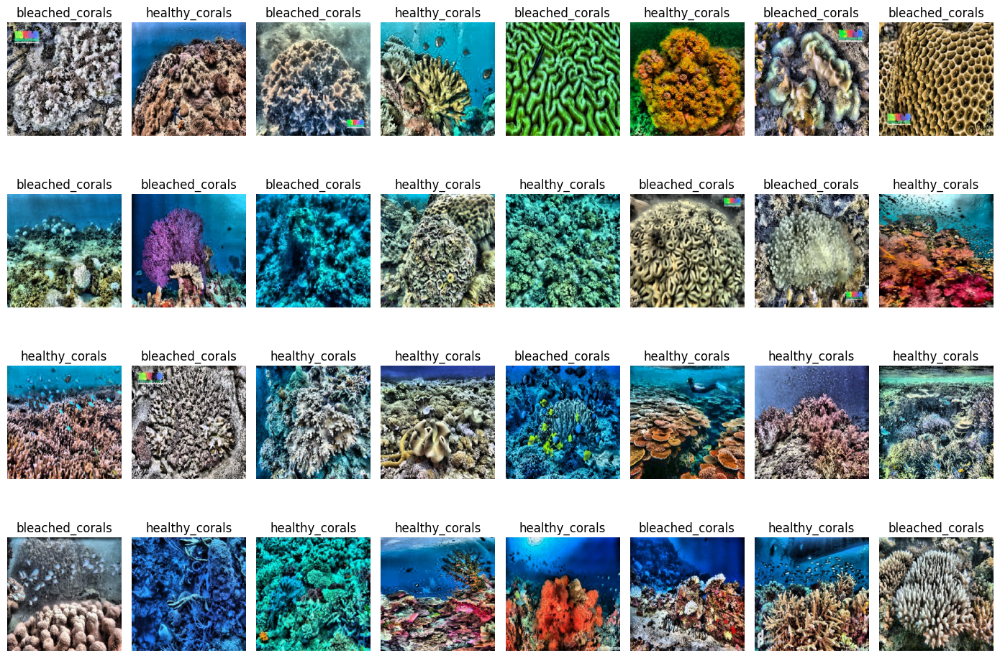

In [32]:
# It is an optionl step you can either implement else you can skip it.
import matplotlib.pyplot as plt
import os, pathlib, numpy as np

class_dir = pathlib.Path("/kaggle/input/koral22/valid")
class_names = np.array(sorted([item.name for item in class_dir.glob('*')]))
images , labels = next(valid_data)
batch_size = images.shape[0]
rows = 4;
cols = (batch_size // rows) if ((batch_size % rows) == 0) else ((batch_size // rows) + 1)
plt.figure(figsize = (14,10))
for iter1 in range(batch_size):
    plt.subplot(rows,cols,iter1+1)
    plt.imshow(images[iter1])
    plt.title(f"{class_names[int(labels[iter1])]}")
    plt.axis("off")
plt.tight_layout()
plt.show()


*In the above images we can infer that label(0) indicates bleached coral and label(1) indicates healthy coral.*

***Here we Go let us build our model for the purpose of coral classification***
***For that we are going to few steps which will be mentinoed below***
1. Development of the model.
2. Plot the curves (Analyse the curves).
3. If it looks good we can move to next step else need to optimze it and goto step 1.
4. Prediction and plotting the confusion matrix.
5. Save the model and load the entire project in the github.

In [33]:
# Step - 1. Let us create our model for coral classification
from tensorflow.keras.layers import Dense , Flatten , Conv2D , MaxPool2D, Dropout
from tensorflow.keras import Sequential
import tensorflow as tf

Coral_Classifier1 = Sequential([
    Conv2D(32, 3, activation = "relu", input_shape = (224,224,3)),
    MaxPool2D(pool_size = 2),
    Conv2D(32, 3, activation = "relu"),
    MaxPool2D(pool_size = 2),
    Conv2D(64, 3, activation = "relu"),
    MaxPool2D(pool_size = 2),
    Conv2D(64, 3, activation = "relu"),
    MaxPool2D(pool_size = 2),
    Flatten(),
    Dense(64, activation = "relu"),
    Dropout(0.5),
    Dense(1 , activation = "sigmoid")
])

# Step - 2. Building the model with callback to find the optimal learning rate
Coral_Classifier1.compile(loss = "binary_crossentropy",
                          optimizer = "Adam",
                          metrics = ["accuracy"])

optimal_learning_rate = tf.keras.callbacks.LearningRateScheduler(lambda epoch : 1e-4 * 10**(epoch/20))

# Step = 3. Training the model
History1 = Coral_Classifier1.fit(train_data,
                                 epochs = 100,
                                 steps_per_epoch = len(train_data),
                                 validation_data = valid_data,
                                 validation_steps = len(valid_data),
                                 callbacks = [optimal_learning_rate])

Epoch 1/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 36s 415ms/step - accuracy: 0.5346 - loss: 0.6904 - val_accuracy: 0.6813 - val_loss: 0.6386 - learning_rate: 1.0000e-04
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - accuracy: 0.6340 - loss: 0.6493 - val_accuracy: 0.6703 - val_loss: 0.5925 - learning_rate: 1.1220e-04
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - accuracy: 0.6615 - loss: 0.6169 - val_accuracy: 0.7473 - val_loss: 0.5328 - learning_rate: 1.2589e-04
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - accuracy: 0.6925 - loss: 0.5907 - val_accuracy: 0.6923 - val_loss: 0.5475 - learning_rate: 1.4125e-04
Epoch 5/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - accuracy: 0.6988 - loss: 0.5713 - val_accuracy: 0.7363 - val_loss: 0.5318 - learning_rate: 1.5849e-04
Epoch 6/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - accuracy: 0.7245 - loss: 0.5598 - val_accuracy: 0.7253 - val_loss: 0.5370 - learning_rate: 1.7783e-04
Epoch 7/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/ste

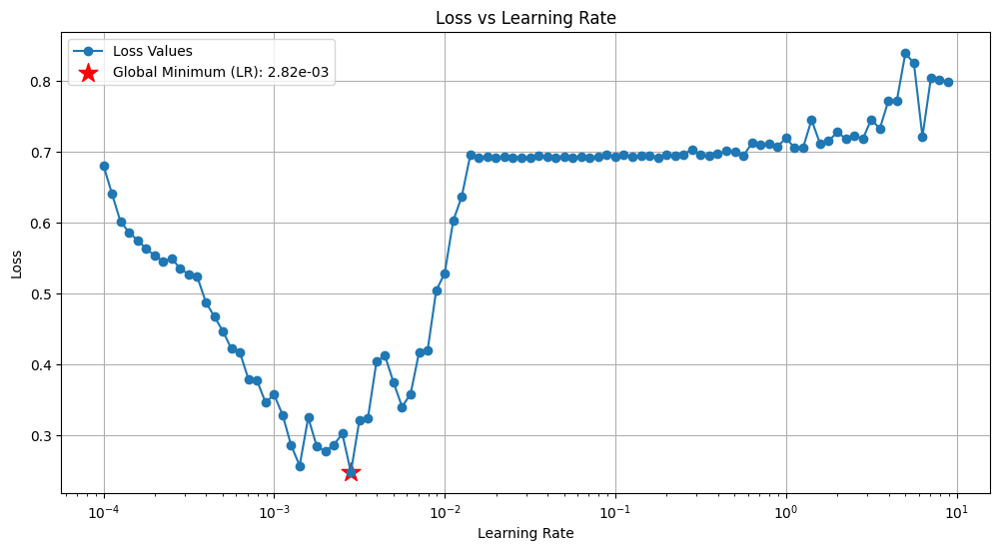

In [40]:
# Now let us plot the loss vs learning rate curve

# Extracting the necessary data from the training history
import pandas as pd
values = pd.DataFrame(History1.history)
index = values['loss'].idxmin()
best_lr = values['learning_rate'][index]
min_loss = values['loss'][index]

# Now plotting the curves
plt.figure(figsize = (12,6))
plt.semilogx(values['learning_rate'], values['loss'], marker='o', label='Loss Values')
plt.scatter(best_lr, min_loss, color='red',marker = '*' , s = 200 ,label=f'Global Minimum (LR): {best_lr:.2e}')
plt.xlabel("Learning Rate")
plt.ylabel("Loss")
plt.title("Loss vs Learning Rate")
plt.legend()
plt.grid(True)
plt.show()

***Based on the above graph we got our optimal learning rate as 2.82e-03 so now we can train our model with this LR and plot the graph and results***

In [43]:
# Step - 1. Our model for coral classification
from tensorflow.keras.layers import Dense , Flatten , Conv2D , MaxPool2D, Dropout
from tensorflow.keras import Sequential
import tensorflow as tf

Coral_Classifier2 = Sequential([
    Conv2D(32, 3, activation = "relu", input_shape = (224,224,3)),
    MaxPool2D(pool_size = 2),
    Conv2D(32, 3, activation = "relu"),
    MaxPool2D(pool_size = 2),
    Conv2D(64, 3, activation = "relu"),
    MaxPool2D(pool_size = 2),
    Conv2D(64, 3, activation = "relu"),
    MaxPool2D(pool_size = 2),
    Flatten(),
    Dense(64, activation = "relu"),
    Dropout(0.5),
    Dense(1 , activation = "sigmoid")
])

# Step - 2. Building the model with optimal learning rate
Coral_Classifier2.compile(loss = "binary_crossentropy",
                          optimizer = tf.keras.optimizers.Adam(learning_rate = 2.82e-03),
                          metrics = ["accuracy"])


# Step = 3. Training the model
History2 = Coral_Classifier2.fit(train_data,
                                 epochs = 100,
                                 steps_per_epoch = len(train_data),
                                 validation_data = valid_data,
                                 validation_steps = len(valid_data))

Epoch 1/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 21s 212ms/step - accuracy: 0.5631 - loss: 0.7284 - val_accuracy: 0.7033 - val_loss: 0.5924
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - accuracy: 0.6369 - loss: 0.6437 - val_accuracy: 0.6923 - val_loss: 0.5911
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - accuracy: 0.6429 - loss: 0.6166 - val_accuracy: 0.6813 - val_loss: 0.5767
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - accuracy: 0.6167 - loss: 0.6468 - val_accuracy: 0.6484 - val_loss: 0.5933
Epoch 5/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - accuracy: 0.6355 - loss: 0.6472 - val_accuracy: 0.7033 - val_loss: 0.5651
Epoch 6/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - accuracy: 0.6693 - loss: 0.5884 - val_accuracy: 0.6703 - val_loss: 0.5272
Epoch 7/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - accuracy: 0.6791 - loss: 0.5590 - val_accuracy: 0.6923 - val_loss: 0.5675
Epoch 8/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - accuracy: 0.7155 - loss: 0.5362 - 

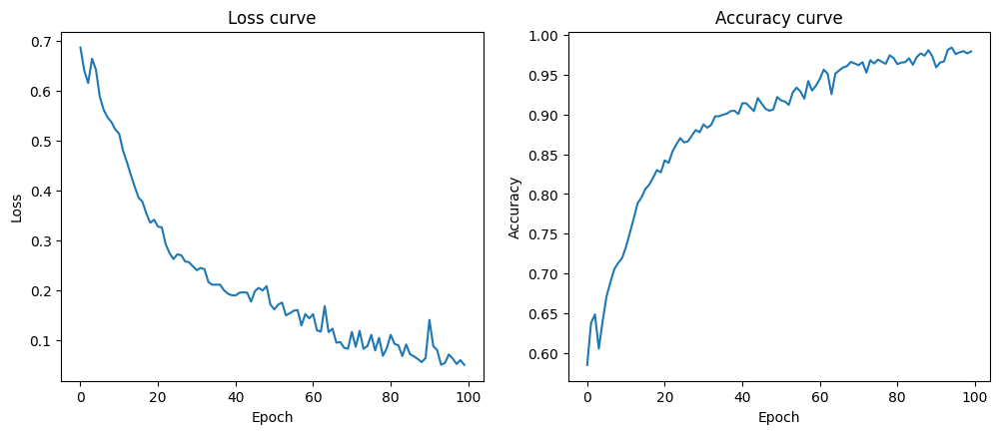

In [45]:
import pandas as pd
values = pd.DataFrame(History2.history)

plt.figure(figsize = (12,10))
plt.subplot(2,2,1)
plt.title("Loss curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
values['loss'].plot()
plt.subplot(2,2,2)
plt.title("Accuracy curve")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
values['accuracy'].plot()
plt.show()

***From the above two graphs we can assure that more optimization need to be made as of now we can proceed with this one***

In [46]:
# Let us look into our model summary to know more about the learning parameters

Coral_Classifier2.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (None, 109, 109, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 24, 24, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 64)                  │         589,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,966,565 (7.50 MB)

 Trainable params: 655,521 (2.50 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,311,044 (5.00 MB)

***We also need to work to reduce the number of learnable parameters in order to make the model quick decisions.***

In [113]:
import matplotlib.pyplot as plt
import tensorflow as tf

def pred_plot_batch(model, data, target_size, class_names):
    images, labels = next(data)
    batch_size = images.shape[0]

    rows = 4
    cols = (batch_size // rows) if (batch_size % rows == 0) else (batch_size // rows + 1)

    plt.figure(figsize=(cols * 3, rows * 3))

    for i in range(batch_size):
        # Resize + normalize for prediction
        image_resized = tf.image.resize(images[i], (target_size, target_size)) / 255.0
        image_expanded = tf.expand_dims(image_resized, axis=0)

        pred_prob = model.predict(image_expanded, verbose=0)
        pred_class_idx = int(tf.round(pred_prob)[0][0])
        actual_class_idx = int(labels[i])

        pred_class = class_names[pred_class_idx]
        actual_class = class_names[actual_class_idx]

        plt.subplot(rows, cols, i + 1)

        # Display image with color fix
        img = images[i]
        if img.dtype == "float32" or img.dtype == "float64":
            if img.max() > 1.0:
                img = img / 255.0
            plt.imshow(img)
        else:
            plt.imshow(img)

        plt.title(f"P: {pred_class}\nA: {actual_class}",
                  color='green' if pred_class == actual_class else 'red',
                  fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [74]:
Coral_Classifier2.evaluate(valid_data)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.6280 - loss: 3.5179


[4.33929967880249, 0.6153846383094788]

***Finally with the help of the above code we can prediction and find***

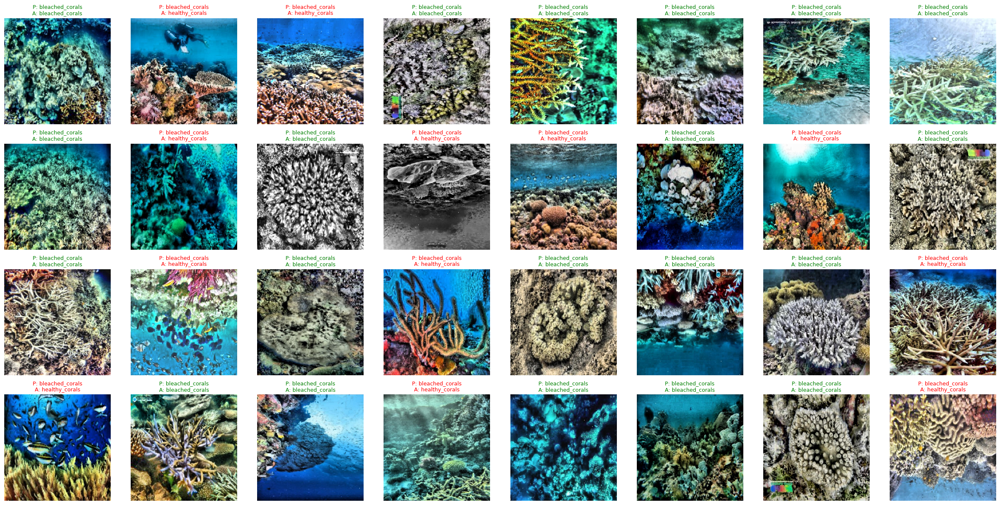

In [114]:
class_names = list(valid_data.class_indices.keys())

pred_plot_batch(model = Coral_Classifier2 , data = train_data , target_size = 224 , class_names = class_names )

***Finally we made some predcition got some results now let us plot the confusion along with the general evaluation metrics***

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step


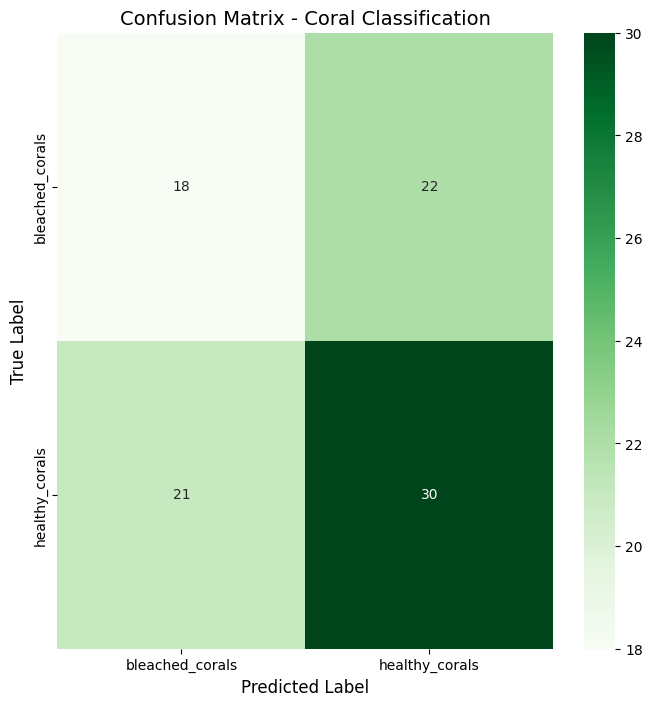

Accuracy:  0.5275
Precision: 0.5769
Recall:    0.5882
F1 Score:  0.5825


In [91]:
# let us plot the confusion matrix and calculate the necessary metrics

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

y_pred_probs = Coral_Classifier2.predict(valid_data) 
y_pred = tf.round(y_pred_probs).numpy().flatten() 
y_true = valid_data.classes  
cm = confusion_matrix(y_true, y_pred)
class_names = valid_data.class_indices.keys()
plt.figure(figsize=(8,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix - Coral Classification', fontsize=14)
plt.show()
acc = accuracy_score(y_true, y_pred)
prec = precision_score(y_true, y_pred)
rec = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
print(f"Accuracy:  {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall:    {rec:.4f}")
print(f"F1 Score:  {f1:.4f}")
     

***NOW WE CAN END THIS SESSION BY SAVING THE MODEL AND ITS WEIGHTS***

In [94]:
# Finally with this let me save the model

# 1. Saving the entire model
Coral_Classifier2.save('Koral22.keras')

# 2. Saving only the weights of the model
Coral_Classifier2.save_weights('koral22_weights.weights.h5')